### 1. Import libraries

In [4]:
# Reference: https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34
# for loading/processing the images
from keras.preprocessing.image import load_img
from keras.applications.vgg16 import preprocess_input

# models
from keras.applications.vgg16 import VGG16
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle


2023-10-14 20:35:26.137525: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### 2. Load Data 

In [3]:
data_path = r"/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/"
# change the working directory to the path where the images are located
os.chdir(data_path)

# this list holds all the image filepaths
image_paths = []

for path, subdirs, files in os.walk(data_path):
    # loops through each file in the directory
    for file in files:
        # adds only the image files to the list
        if file.endswith(('JPG', 'jpeg', 'png', 'jpg', 'gif', 'webp')):
            image_paths.append(os.path.join(path,file))
            
print(image_paths[:10])


['/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/pressure_cooker/Screen Shot 2023-09-25 at 7.44.11 PM.png', '/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/pressure_cooker/51K1LMDAvkL.jpeg', '/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/pressure_cooker/Screen Shot 2023-09-25 at 7.45.40 PM.png', '/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/pressure_cooker/Screen Shot 2023-09-25 at 7.43.17 PM.png', '/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/pressure_cooker/Screen Shot 2023-09-25 at 7.46.51 PM.png', '/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/pressure_cooker/Screen Shot 2023-09-25 at 7.43.54 PM.png', '/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/final_data/not-dishwasher-safe/pressure_cooker/Screen Shot 2023-09-25 at 7.47.02 PM.png', '/Users/anushree/Deskt

### 3.2 Apply clustering 
#### Extract features using VGG16

The following code helps to visualize cluster of similar images using KNN algorithm.
The features of the image are extracted using VGG and reduced using VGG before using in the KNN algorithm.

In [5]:
features_pkl = r"/Users/anushree/Desktop/Dishwasher-safe Or Not/Data/data_features.pkl"

model = VGG16()
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

In [15]:
def extract_features(file, model):
        # load the image as a 224x224 array
        img = load_img(file, target_size=(224, 224))
        # convert from 'PIL.Image.Image' to numpy array
        img = np.array(img)
        # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
        reshaped_img = img.reshape(1, 224, 224, 3)
        # prepare image for model
        imgx = preprocess_input(reshaped_img)
        # get the feature vector
        features = model.predict(imgx, use_multiprocessing=True)
        return features
    

In [16]:
def extract_and_save_features(image_paths, model):
    features_data = {}
    
    for f in image_paths:
#         print(f)
#         # Testing image path
#         # load the image as a 224x224 array
#         img = load_img(f, target_size=(256,256))
#         # convert from 'PIL.Image.Image' to numpy array
#         img = np.array(img)
#         print(img.shape)
#         break
        
        try:
            feat = extract_features(f, model)
            features_data[f] = feat
        # if something fails, save the extracted features as a pickle file (optional)
        except:
            print("Error:",f)
            with open(features_pkl, 'wb') as file:
                pickle.dump(features_data, file)

    with open(features_pkl, 'wb') as file:
        pickle.dump(features_data, file)
            

In [11]:
extract_and_save_features(image_paths, model)

1/1 [==============================] - 0s 168ms/step


1/1 [==============================] - 0s 181ms/step


#### Create clusters using KNN

In [6]:
# function that lets you view a cluster 
def view_cluster(cluster):
    print("Cluster Size:",len(cluster))
    
    # only allow up to 30 images to be shown at a time
    if len(cluster) > 30:
        cluster = cluster[:29]
        
    plt.figure(figsize=(25, 25))
    # plot each image in the cluster
    for index, file in enumerate(cluster):
        plt.subplot(10, 10, index + 1)
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')
        
    plt.show()

def X_after_PCA(data):
    # get a list of just the features
    features = np.array(list(data.values()))
    # reshape so that there are 210 samples of 4096 vectors
    features = features.reshape(-1, 4096)
    
    print(features.shape)

    # reduce the amount of dimensions in the feature vector
    pca = PCA(n_components=500)
    pca.fit(features)
    x = pca.transform(features)
    print(f"Components before PCA: {features.shape[1]}")
    print(f"Components after PCA: {pca.n_components}")
    
    return x
    
def create_clusters(data,k):
    # get a list of the filenames
    filenames = np.array(list(data.keys()))
    
    x = X_after_PCA(data)
    
    # cluster feature vectors
    kmeans = KMeans(n_clusters=k, random_state=22)
    kmeans.fit(x)

    # holds the cluster id and the images { id: [images] }
    clusters = {}
    for file, cluster in zip(filenames, kmeans.labels_):
        if cluster not in clusters.keys():
            clusters[cluster] = []
            clusters[cluster].append(file)
        else:
            clusters[cluster].append(file)

    return clusters

sse = []       
def find_k(data):
    # get a list of the filenames
    filenames = np.array(list(data.keys()))
    
    x = X_after_PCA(data)

    # this is just incase you want to see which value for k might be the best
    
    list_k = list(range(5, 500))

    for k in list_k:
        km = KMeans(n_clusters=k, random_state=22)
        km.fit(x)

        sse.append(km.inertia_)

    # Plot sse against k
    plt.figure(figsize=(6, 6))
    plt.plot(list_k, sse)
    plt.xlabel(r'Number of clusters *k*')
    plt.ylabel('Sum of squared distance');
    plt.show()



(521, 4096)
Components before PCA: 4096
Components after PCA: 500


/Users/anushree/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster: 10
Cluster Size: 7


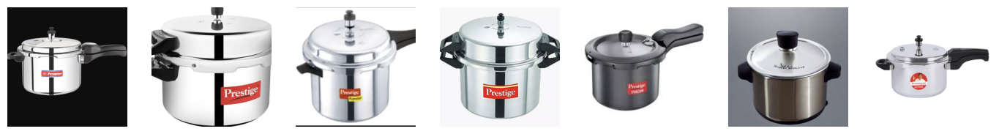

Cluster: 45
Cluster Size: 6


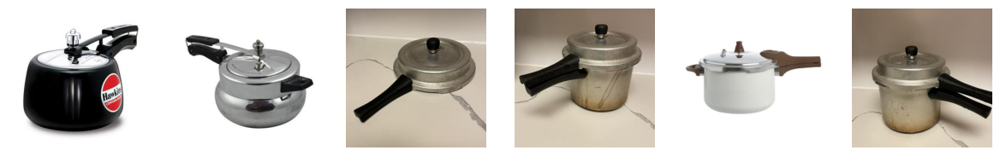

Cluster: 40
Cluster Size: 7


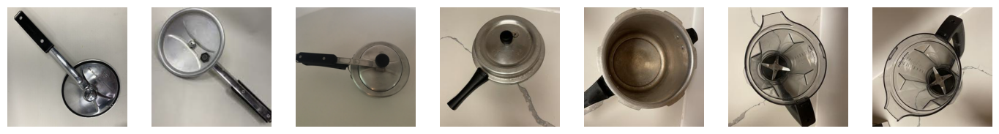

Cluster: 37
Cluster Size: 2


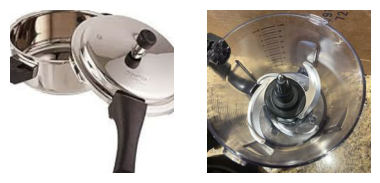

Cluster: 25
Cluster Size: 2


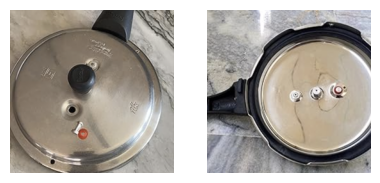

Cluster: 8
Cluster Size: 15


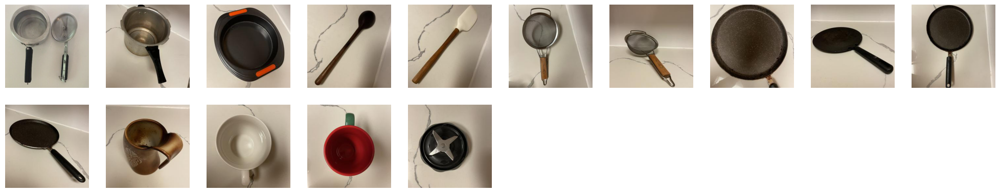

Cluster: 11
Cluster Size: 3


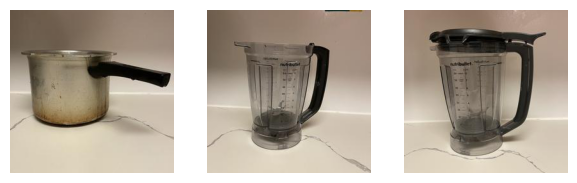

Cluster: 42
Cluster Size: 5


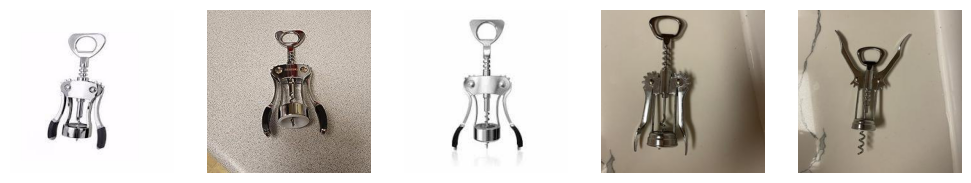

Cluster: 38
Cluster Size: 13


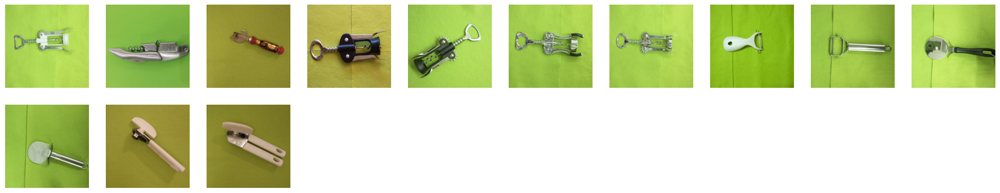

Cluster: 1
Cluster Size: 13


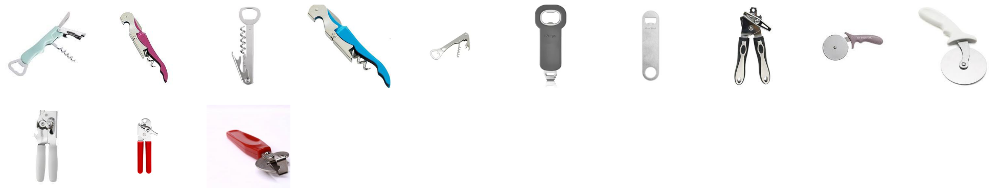

Cluster: 9
Cluster Size: 32


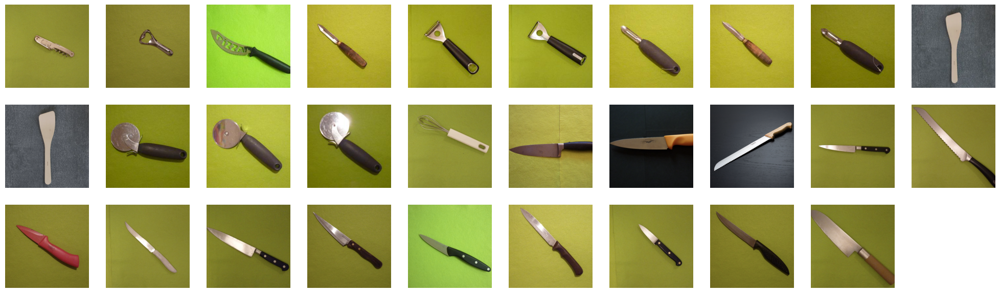

Cluster: 49
Cluster Size: 5


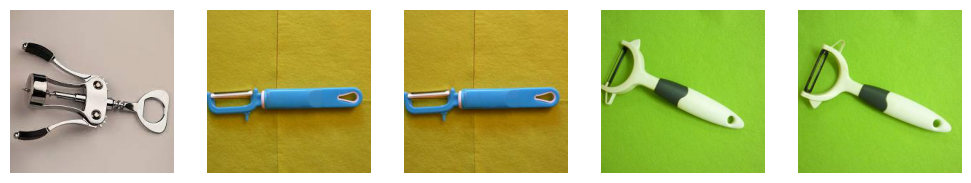

Cluster: 0
Cluster Size: 1


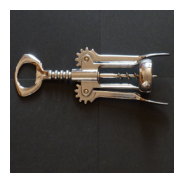

Cluster: 56
Cluster Size: 8


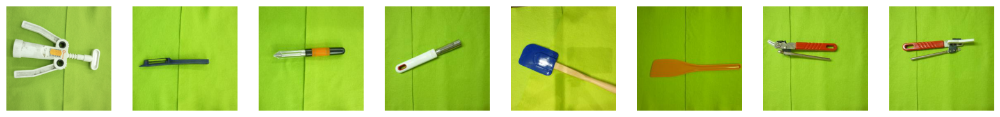

Cluster: 36
Cluster Size: 12


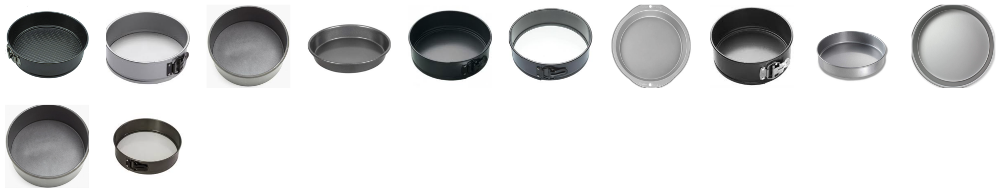

Cluster: 34
Cluster Size: 11


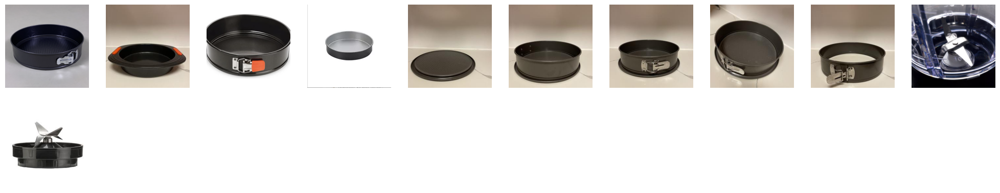

Cluster: 6
Cluster Size: 3


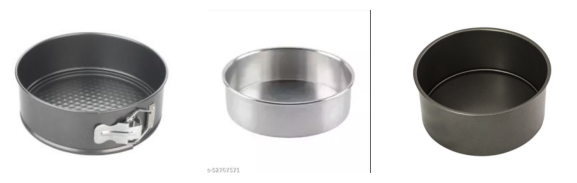

Cluster: 18
Cluster Size: 3


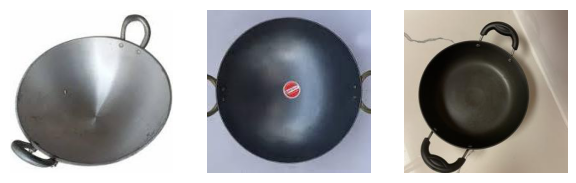

Cluster: 46
Cluster Size: 9


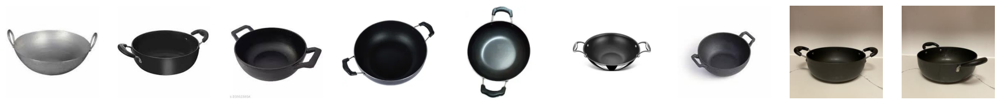

Cluster: 23
Cluster Size: 10


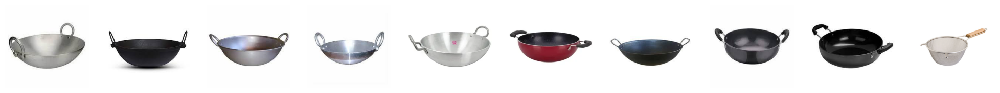

Cluster: 39
Cluster Size: 5


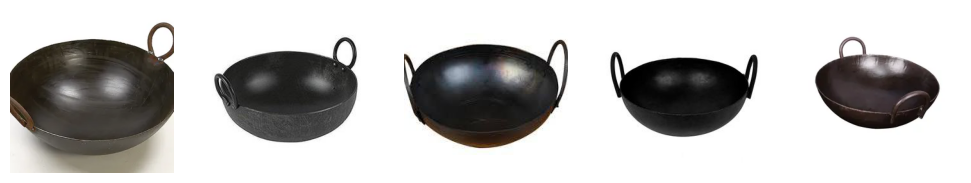

Cluster: 59
Cluster Size: 14


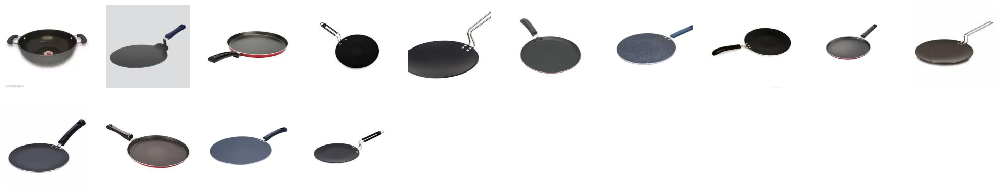

Cluster: 51
Cluster Size: 8


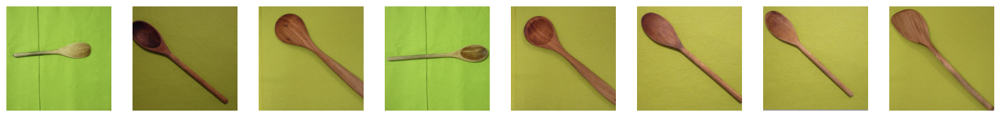

Cluster: 55
Cluster Size: 6


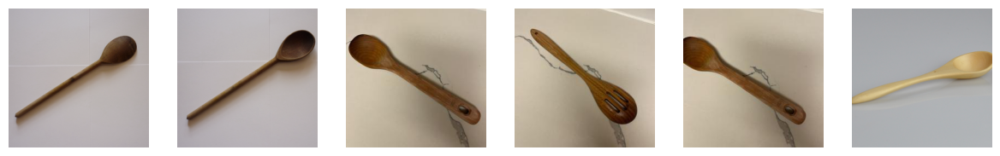

Cluster: 22
Cluster Size: 9


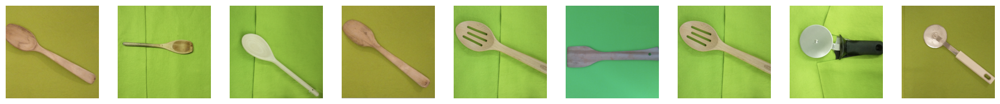

Cluster: 2
Cluster Size: 4


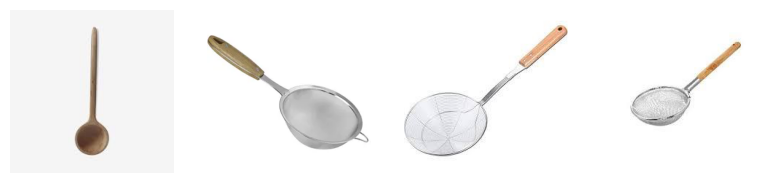

Cluster: 29
Cluster Size: 13


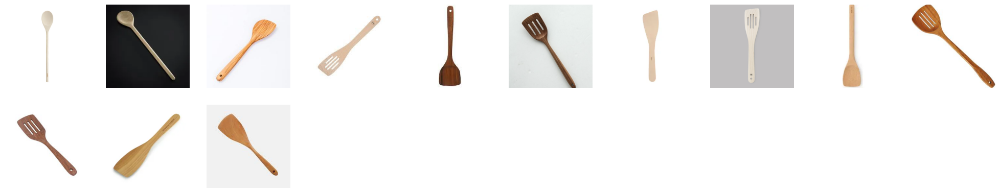

Cluster: 26
Cluster Size: 17


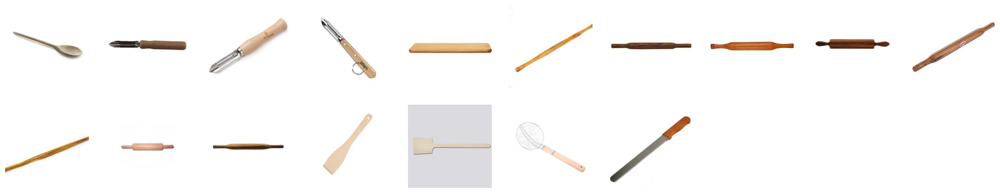

Cluster: 30
Cluster Size: 7


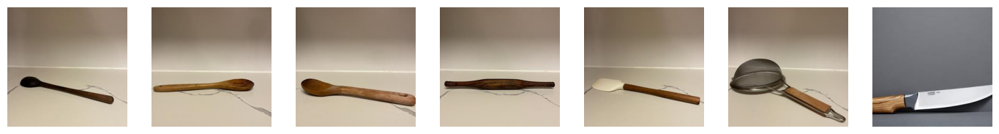

Cluster: 41
Cluster Size: 10


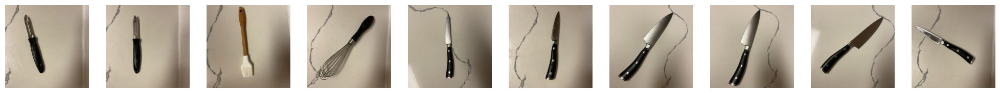

Cluster: 24
Cluster Size: 10


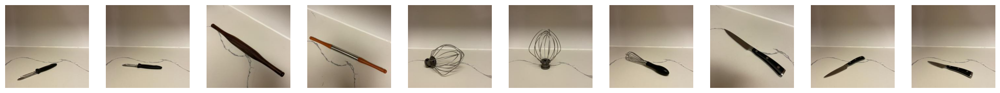

Cluster: 20
Cluster Size: 23


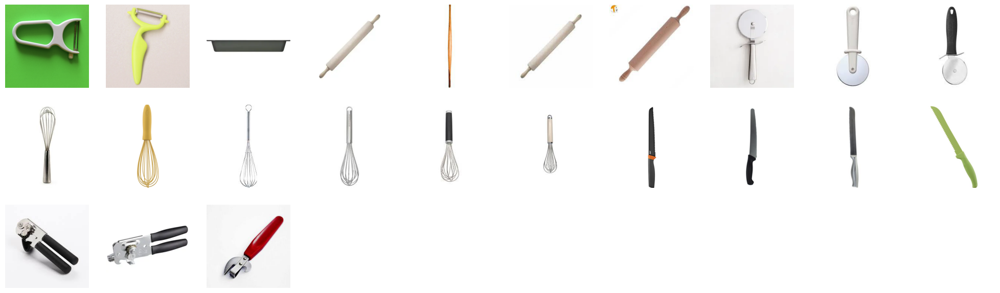

Cluster: 48
Cluster Size: 8


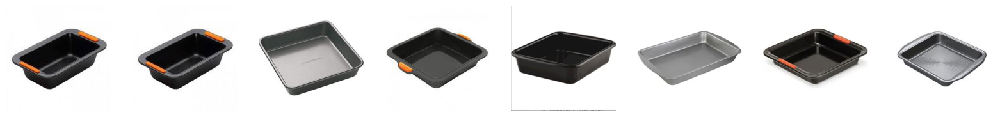

Cluster: 16
Cluster Size: 22


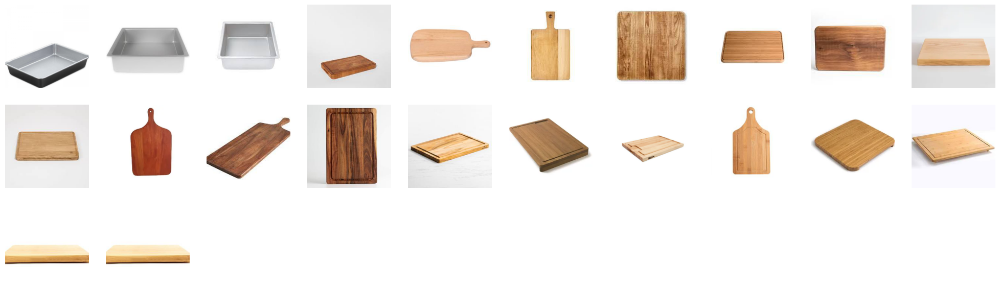

Cluster: 53
Cluster Size: 5


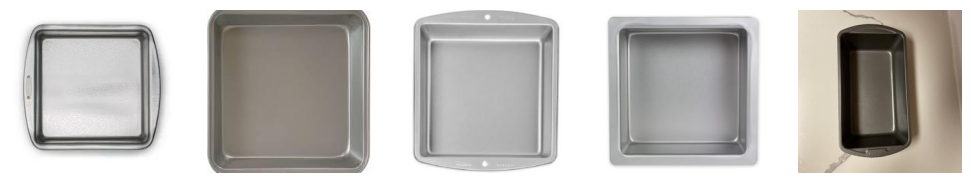

Cluster: 21
Cluster Size: 7


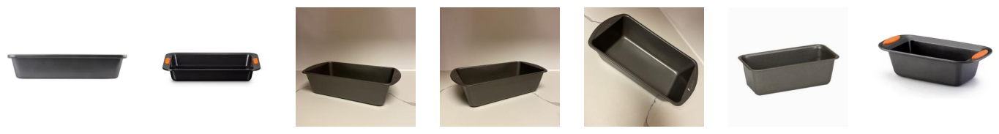

Cluster: 7
Cluster Size: 3


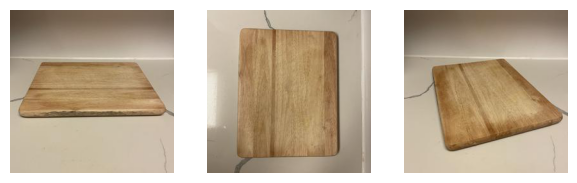

Cluster: 50
Cluster Size: 10


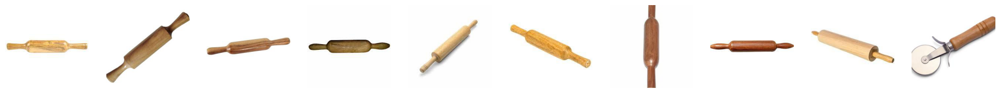

Cluster: 14
Cluster Size: 9


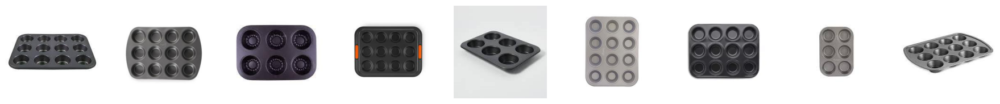

Cluster: 35
Cluster Size: 11


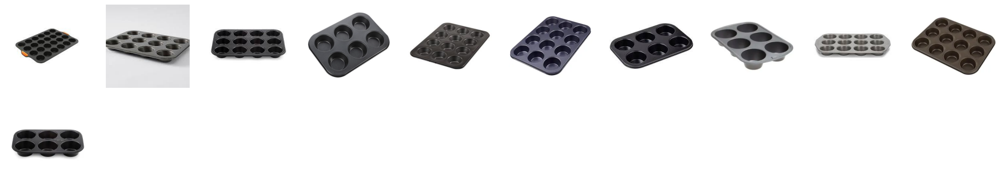

Cluster: 17
Cluster Size: 2


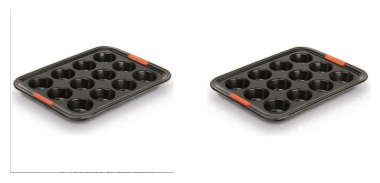

Cluster: 47
Cluster Size: 12


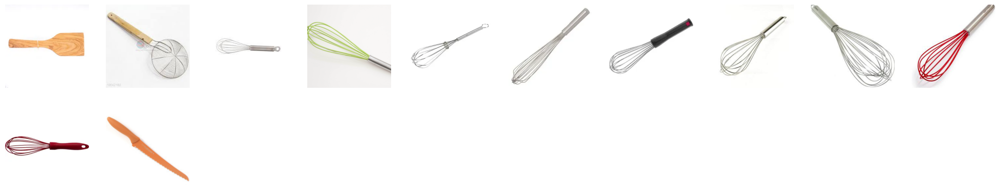

Cluster: 13
Cluster Size: 11


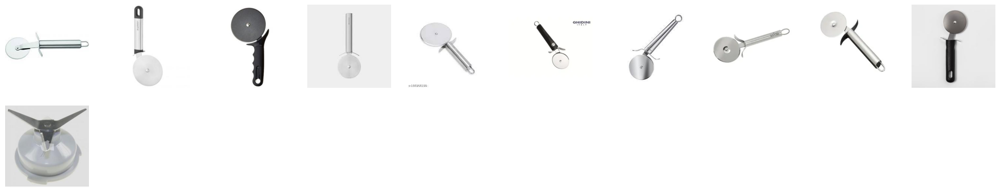

Cluster: 27
Cluster Size: 9


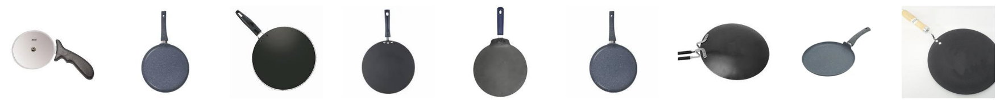

Cluster: 19
Cluster Size: 13


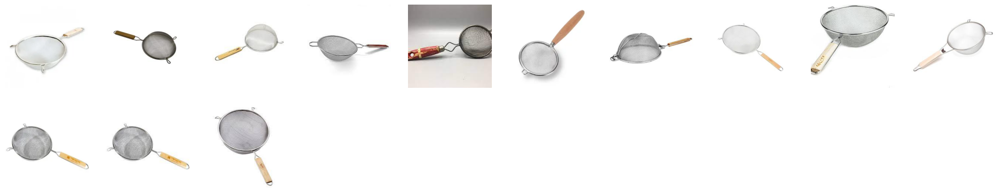

Cluster: 31
Cluster Size: 4


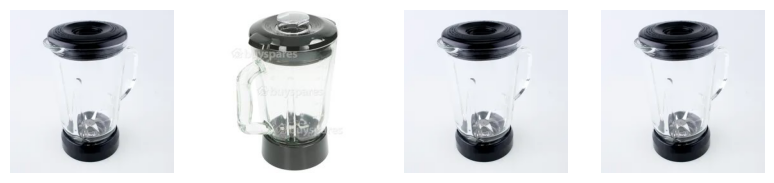

Cluster: 28
Cluster Size: 19


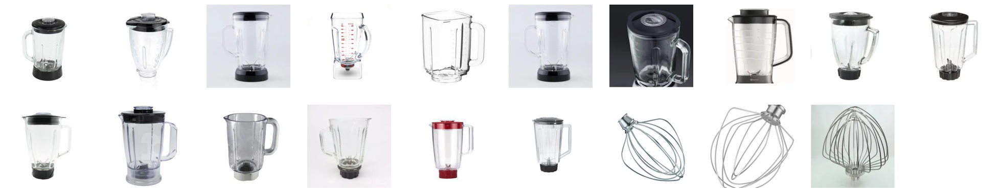

Cluster: 12
Cluster Size: 5


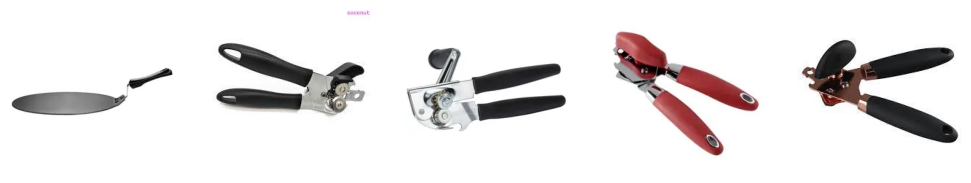

Cluster: 3
Cluster Size: 18


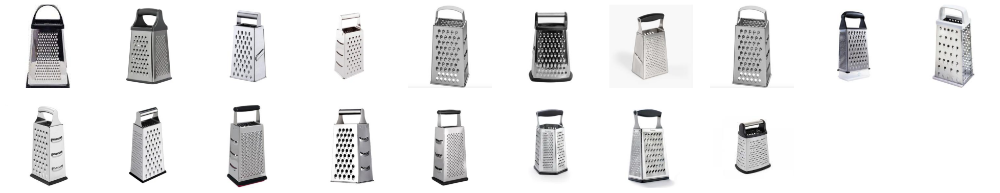

Cluster: 44
Cluster Size: 6


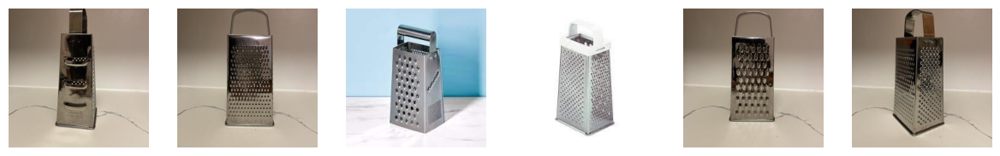

Cluster: 15
Cluster Size: 12


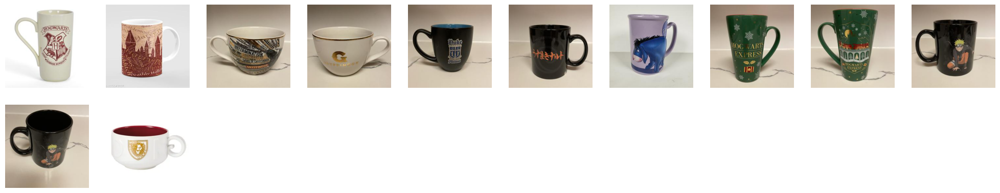

Cluster: 58
Cluster Size: 3


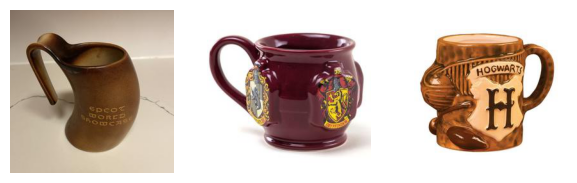

Cluster: 32
Cluster Size: 5


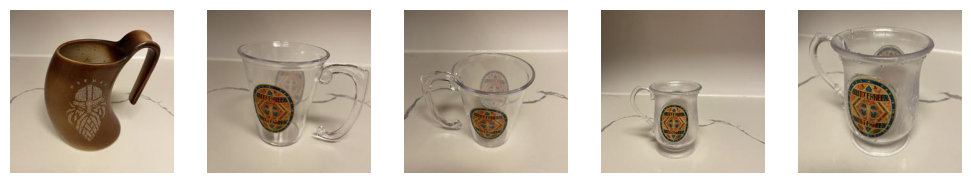

Cluster: 52
Cluster Size: 7


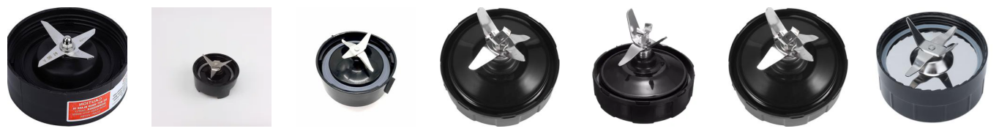

Cluster: 33
Cluster Size: 8


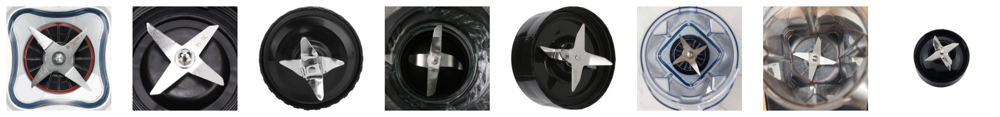

Cluster: 54
Cluster Size: 3


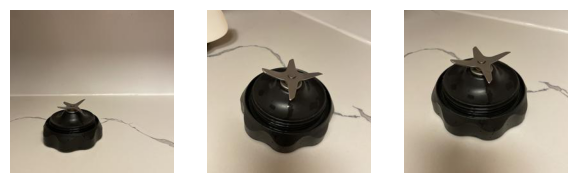

Cluster: 43
Cluster Size: 1


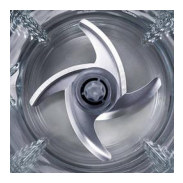

Cluster: 4
Cluster Size: 3


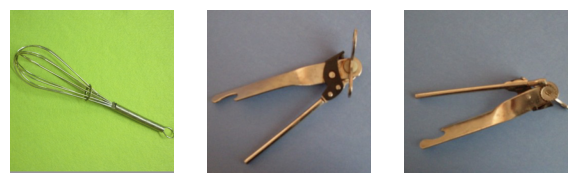

Cluster: 5
Cluster Size: 7


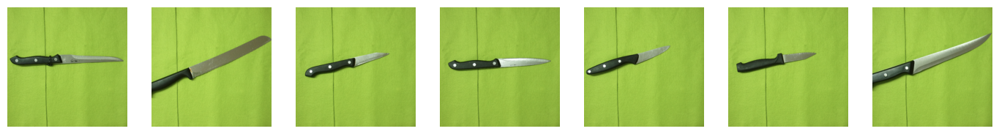

Cluster: 57
Cluster Size: 5


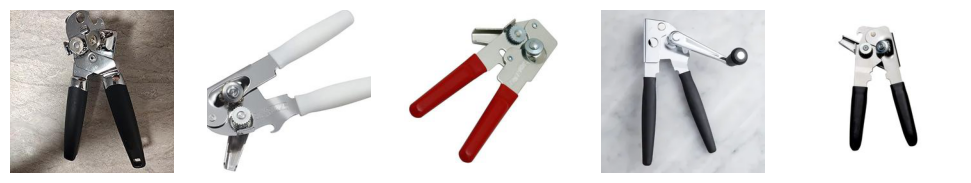

In [7]:
with (open(features_pkl, "rb")) as file:
    data = pickle.load(file)
#     find_k(data)
    
    k = 60
    clusters = create_clusters(data,k)

    for cluster in clusters.keys():
        print("Cluster:", cluster)
        view_cluster(clusters[cluster])


Author: **Anushree Das**

Social Media: [LinkedIn](https://www.linkedin.com/in/anushree-s-das)

Link to blog post: 